In [2]:
import os
import sys
import json
import numpy as np
import time
from PIL import Image, ImageDraw

In [3]:
# Set the ROOT_DIR variable to the root directory of the Mask_RCNN git repo
ROOT_DIR = '../..'
assert os.path.exists(ROOT_DIR), 'ROOT_DIR does not exist. Did you forget to read the instructions above? ;)'

# Import mrcnn libraries
sys.path.append(ROOT_DIR) 
from Mask_RCNN.mrcnn.config import Config
import Mask_RCNN.mrcnn.utils as utils
from Mask_RCNN.mrcnn import visualize
import Mask_RCNN.mrcnn.model as modellib

In [4]:
# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "Mask_RCNN/logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "Mask_RCNN/model_weights/mask_rcnn_drone.h5")

# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

In [5]:
# class CigButtsConfig(Config):
#     """Configuration for training on the cigarette butts dataset.
#     Derives from the base Config class and overrides values specific
#     to the cigarette butts dataset.
#     """
#     # Give the configuration a recognizable name
#     NAME = "cig_butts"

#     # Train on 1 GPU and 1 image per GPU. Batch size is 1 (GPUs * images/GPU).
#     GPU_COUNT = 1
#     IMAGES_PER_GPU = 1

#     # Number of classes (including background)
#     NUM_CLASSES = 1 + 1  # background + 1 (cig_butt)

#     # All of our training images are 512x512
#     IMAGE_MIN_DIM = 512
#     IMAGE_MAX_DIM = 512

#     # You can experiment with this number to see if it improves training
#     STEPS_PER_EPOCH = 500

#     # This is how often validation is run. If you are using too much hard drive space
#     # on saved models (in the MODEL_DIR), try making this value larger.
#     VALIDATION_STEPS = 5
    
#     # Matterport originally used resnet101, but I downsized to fit it on my graphics card
#     BACKBONE = 'resnet50'

#     # To be honest, I haven't taken the time to figure out what these do
#     RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)
#     TRAIN_ROIS_PER_IMAGE = 32
#     MAX_GT_INSTANCES = 50 
#     POST_NMS_ROIS_INFERENCE = 500 
#     POST_NMS_ROIS_TRAINING = 1000 
    
# config = CigButtsConfig()
# config.display()

In [6]:
class CocoLikeDataset(utils.Dataset):
    """ Generates a COCO-like dataset, i.e. an image dataset annotated in the style of the COCO dataset.
        See http://cocodataset.org/#home for more information.
    """
    def load_data(self, annotation_json, images_dir):
        """ Load the coco-like dataset from json
        Args:
            annotation_json: The path to the coco annotations json file
            images_dir: The directory holding the images referred to by the json file
        """
        # Load json from file
        json_file = open(annotation_json)
        coco_json = json.load(json_file)
        json_file.close()
        
        # Add the class names using the base method from utils.Dataset
        source_name = "coco_like"
        for category in coco_json['categories']:
            class_id = category['id']
            class_name = category['name']
            if class_id < 1:
                print('Error: Class id for "{}" cannot be less than one. (0 is reserved for the background)'.format(class_name))
                return
            
            self.add_class(source_name, class_id, class_name)
        
        # Get all annotations
        annotations = {}
        for annotation in coco_json['annotations']:
            image_id = annotation['image_id']
            if image_id not in annotations:
                annotations[image_id] = []
            annotations[image_id].append(annotation)
        
        # Get all images and add them to the dataset
        seen_images = {}
        for image in coco_json['images']:
            image_id = image['id']
            if image_id in seen_images:
                print("Warning: Skipping duplicate image id: {}".format(image))
            else:
                seen_images[image_id] = image
                try:
                    image_file_name = image['file_name']
                    image_width = image['width']
                    image_height = image['height']
                except KeyError as key:
                    print("Warning: Skipping image (id: {}) with missing key: {}".format(image_id, key))
                
                image_path = os.path.abspath(os.path.join(images_dir, image_file_name))
                image_annotations = annotations[image_id]
                
                # Add the image using the base method from utils.Dataset
                self.add_image(
                    source=source_name,
                    image_id=image_id,
                    path=image_path,
                    width=image_width,
                    height=image_height,
                    annotations=image_annotations
                )
                
    def load_mask(self, image_id):
        """ Load instance masks for the given image.
        MaskRCNN expects masks in the form of a bitmap [height, width, instances].
        Args:
            image_id: The id of the image to load masks for
        Returns:
            masks: A bool array of shape [height, width, instance count] with
                one mask per instance.
            class_ids: a 1D array of class IDs of the instance masks.
        """
        image_info = self.image_info[image_id]
        annotations = image_info['annotations']
        instance_masks = []
        class_ids = []
        
        for annotation in annotations:
            class_id = annotation['category_id']
            mask = Image.new('1', (image_info['width'], image_info['height']))
            mask_draw = ImageDraw.ImageDraw(mask, '1')
            for segmentation in annotation['segmentation']:
                mask_draw.polygon(segmentation, fill=1)
                bool_array = np.array(mask) > 0
                instance_masks.append(bool_array)
                class_ids.append(class_id)

        mask = np.dstack(instance_masks)
        class_ids = np.array(class_ids, dtype=np.int32)
        
        return mask, class_ids

In [7]:
# dataset_train = CocoLikeDataset()
# dataset_train.load_data('./datasets/cig_butts/train/coco_annotations.json', './datasets/cig_butts/train/images')
# dataset_train.prepare()

# dataset_val = CocoLikeDataset()
# dataset_val.load_data('./datasets/droneDetection/val/_label.json', './datasets/droneDetection/val/images')
# dataset_val.prepare()

dataset_test = CocoLikeDataset()
dataset_test.load_data('/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/_label.json',
                       '/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/images')
dataset_test.prepare()

class_names = ['BG', 'target']

In [8]:
class InferenceConfig(Config):
    
    # Give the configuration a recognizable name
    NAME = "drones_detection"

    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512
    DETECTION_MIN_CONFIDENCE = 0.9
    
     # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # background + 1 (cig_butt)

    # You can experiment with this number to see if it improves training
    STEPS_PER_EPOCH = 500

    # This is how often validation is run. If you are using too much hard drive space
    # on saved models (in the MODEL_DIR), try making this value larger.
    VALIDATION_STEPS = 5
    
    # Matterport originally used resnet101, but I downsized to fit it on my graphics card
    BACKBONE = 'resnet50'

    # To be honest, I haven't taken the time to figure out what these do
    RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)
    TRAIN_ROIS_PER_IMAGE = 32
    MAX_GT_INSTANCES = 50 
    POST_NMS_ROIS_INFERENCE = 500 
    POST_NMS_ROIS_TRAINING = 1000 
    
    USE_MINI_MASK = False

inference_config = InferenceConfig()
inference_config.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE              

In [9]:
# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

Instructions for updating:
The `validate_indices` argument has no effect. Indices are always validated on CPU and never validated on GPU.
Instructions for updating:
Use fn_output_signature instead


In [10]:
# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")
# model_path = model.find_last()
model_path = "/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/model_weights/mask_rcnn_drone.h5"

# Load trained weights (fill in path to trained weights here)
assert model_path != "", "Provide path to trained weights"
print("Loading weights from ", model_path)
# model.load_weights(model_path, by_name=True, exclude=["mrcnn_class_logits","mrcnn_bbox_fc", "mrcnn_mask"])
model.load_weights(model_path, by_name=True)

Loading weights from  /home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/model_weights/mask_rcnn_drone.h5


In [11]:
def evaluate_model(dataset, model, cfg):
    APs = []
    count = 0
    
    for image_id in dataset.image_ids:
        print(image_id)
        
        if count == 3:
            break
            
        count+=1
        ####load image, bounding boxes and masks for the image id
        image, _, gt_class_id, gt_bbox, gt_mask = load_image_gt(dataset, cfg, image_id)
        
        gt_class_id_resized = np.resize(gt_class_id,(1,))
        gt_bbox_resized = np.resize(gt_bbox,(1,4))
        gt_mask_resized = np.resize(gt_mask,(512,512,1)) 
        
        #### make prediction
        results = model.detect([image], verbose=1)
        #### extract results for first sample
        r = results[0]
        
        visualize.display_instances(image, gt_bbox_resized, r['masks'], gt_class_id_resized, class_names, figsize=(15,15))
        plt.show()
        
        visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'], figsize=(15,15))
        plt.show()
        
        #### calculate statistics, including AP
#         AP, precisions, recalls, overlaps = compute_ap(gt_bbox, gt_class_id, gt_mask, r["rois"], r["class_ids"], r["scores"], r['masks'])
        AP, precisions, recalls, overlaps = compute_ap(gt_bbox_resized, gt_class_id_resized, r['masks'], r["rois"], r["class_ids"], r["scores"], r['masks'])
        
        print(f"#####################\t{AP}\t#####################")
        print(f"\ngt: {gt_bbox_resized} predicted: {r['rois']}")
        print(f"\ngt: {gt_class_id_resized} predicted: {r['class_ids']}")
        print(f"\ngt shape : {gt_mask_resized.shape} predicted shape: {r['masks'].shape}")
        print(f"\ngt: {gt_mask_resized} predicted: {r['masks']}")

        ####store
        APs.append(AP)
        
        
    
    return APs

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_19.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  252.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  135.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/dylan/anaconda3/envs/my_env/lib/python3.9/site-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


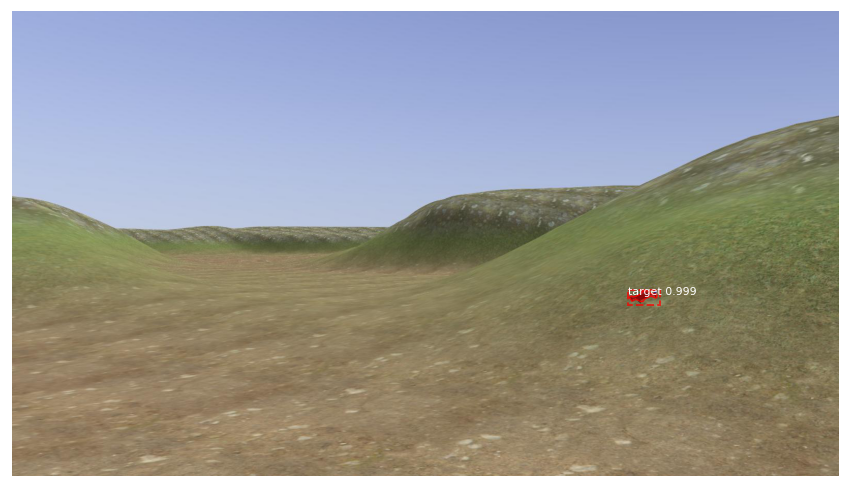

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_22.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  249.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  139.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


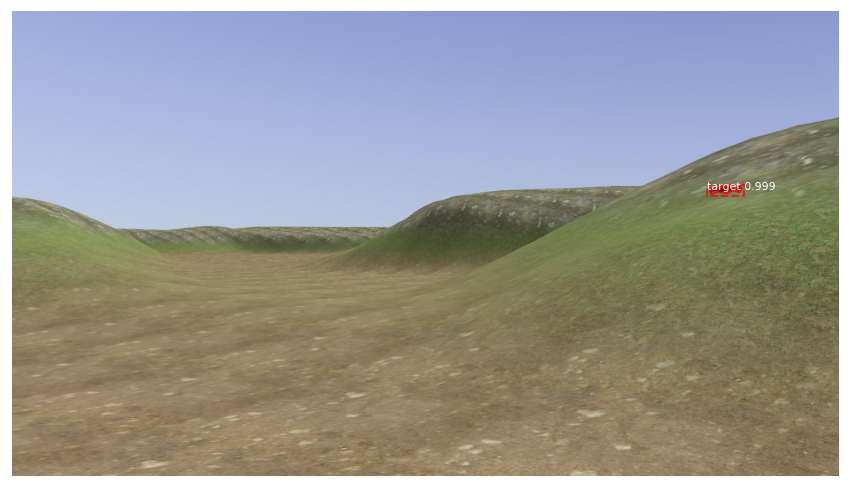

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_3.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  250.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  137.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


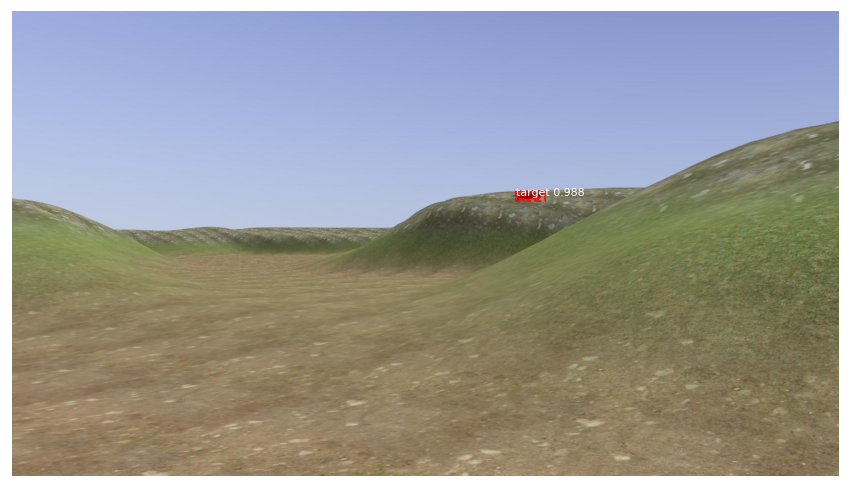

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_25.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  134.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


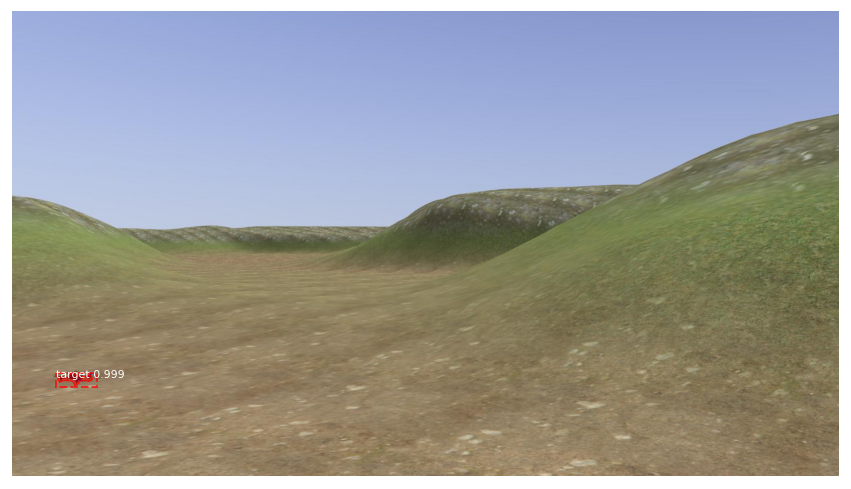

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_18.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  150.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


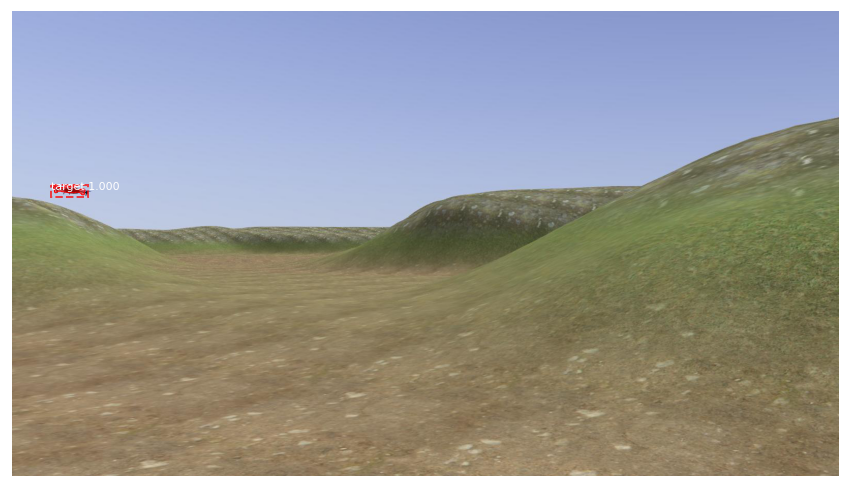

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_24.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  253.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  135.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


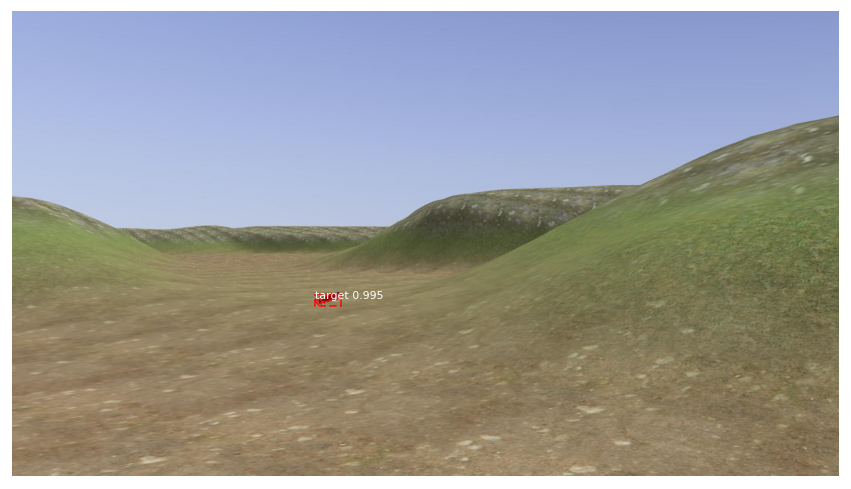

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_11.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  138.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


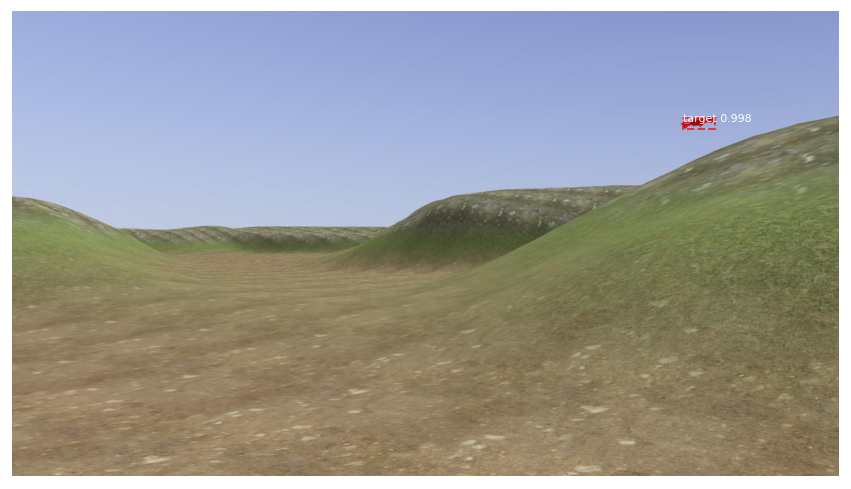

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_2.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  147.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


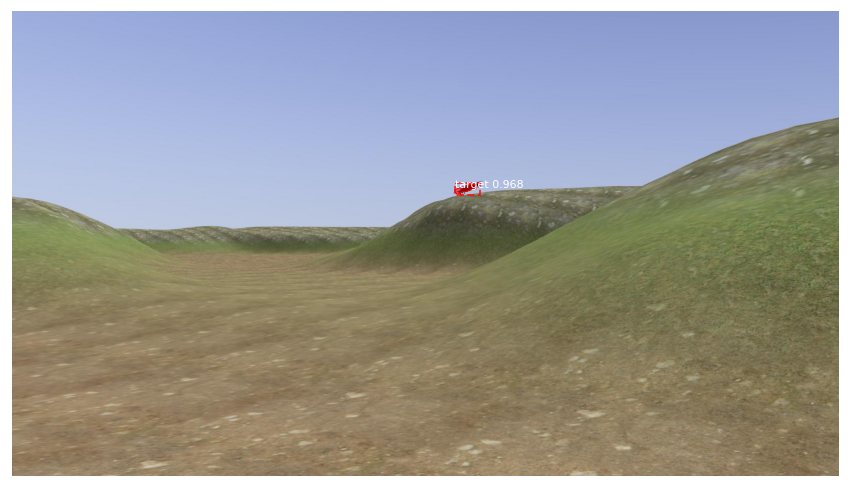

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_13.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  254.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  137.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


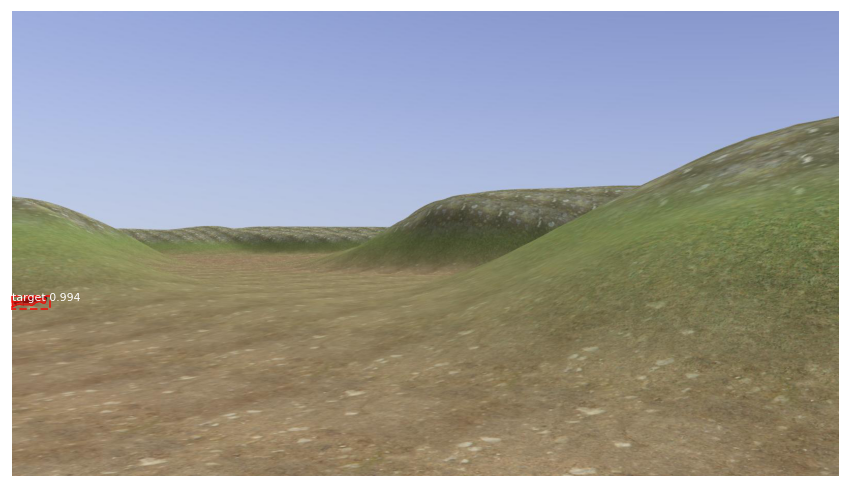

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_23.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  253.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  138.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


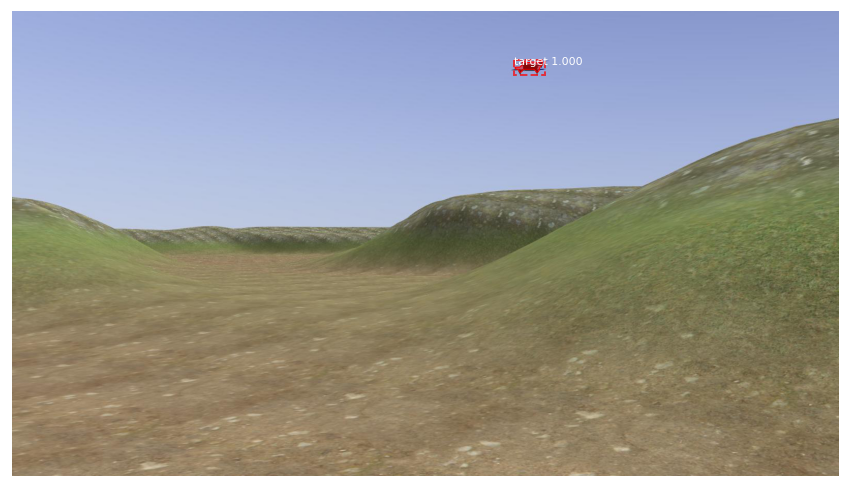

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_9.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  142.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


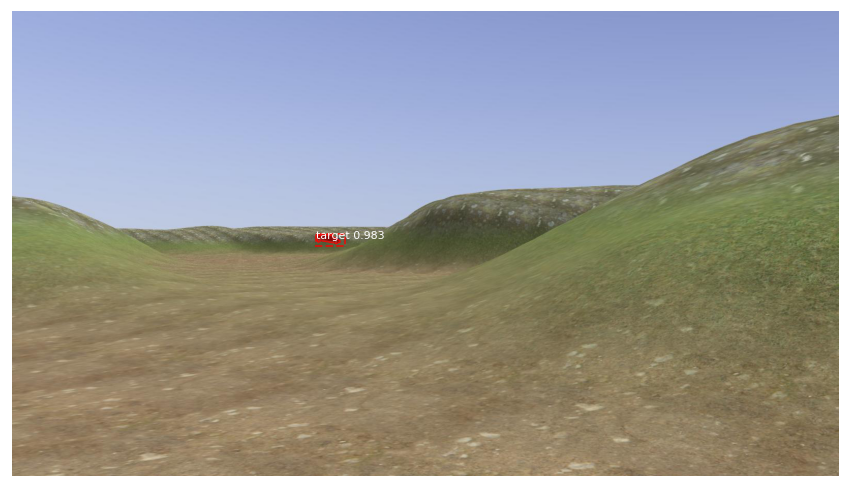

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_5.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  134.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


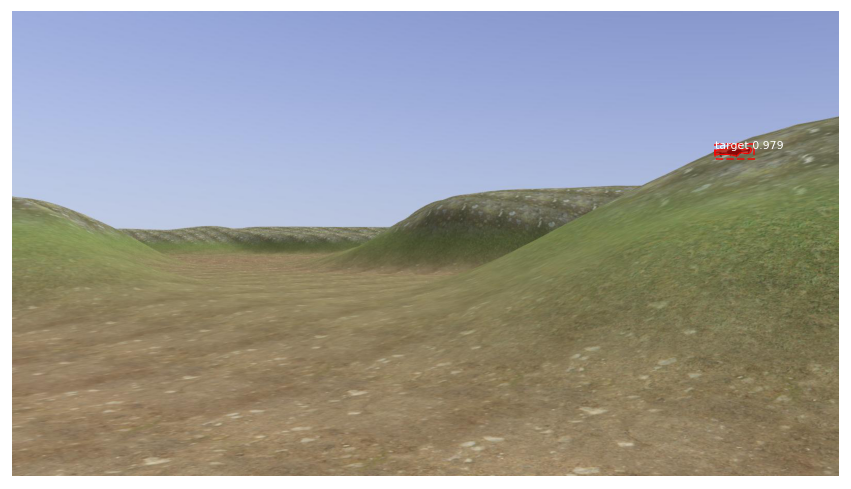

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_20.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  251.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  142.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


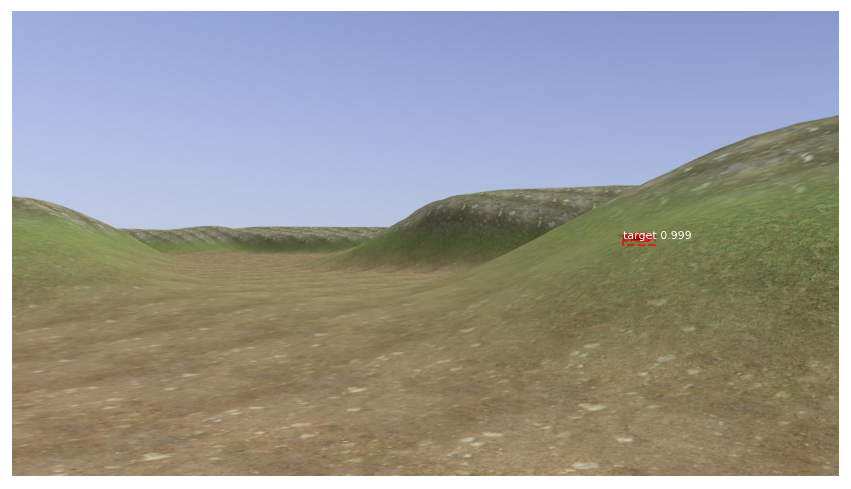

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_7.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  248.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  135.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


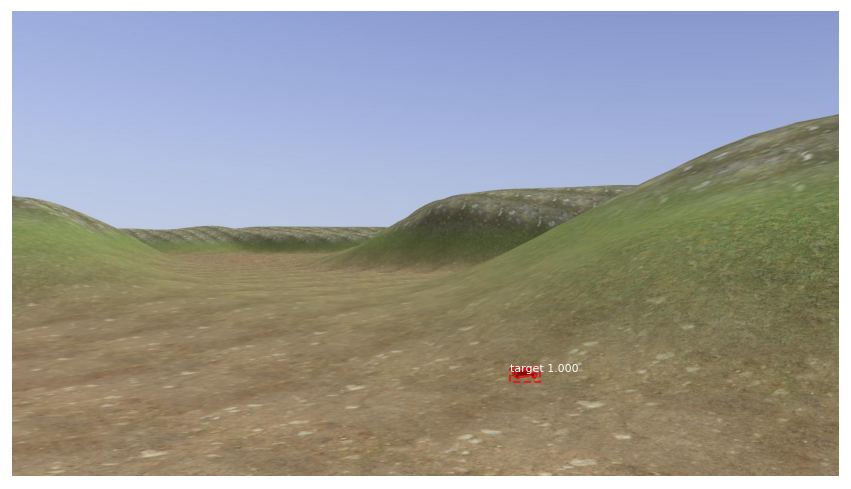

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_4.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  253.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  136.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


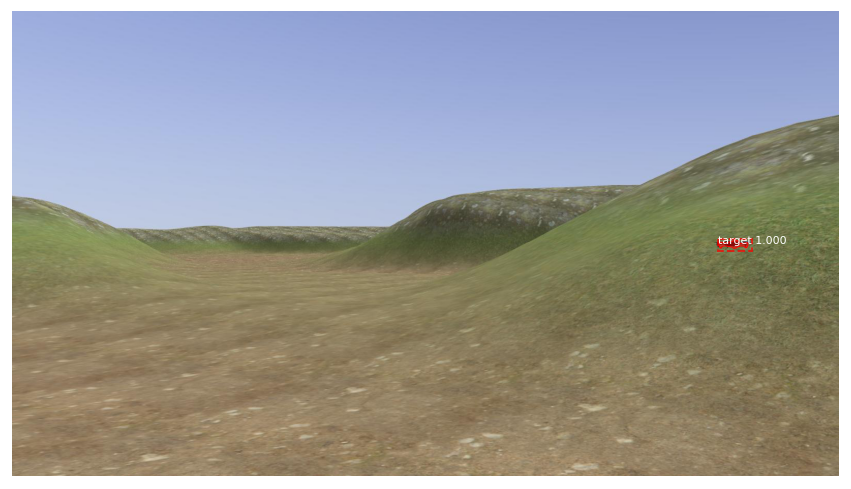

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_10.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  251.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  135.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


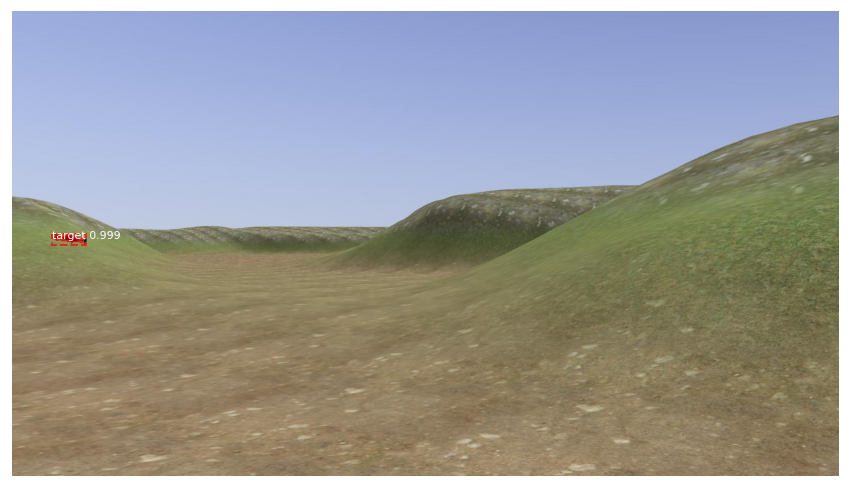

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_15.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  253.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  139.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


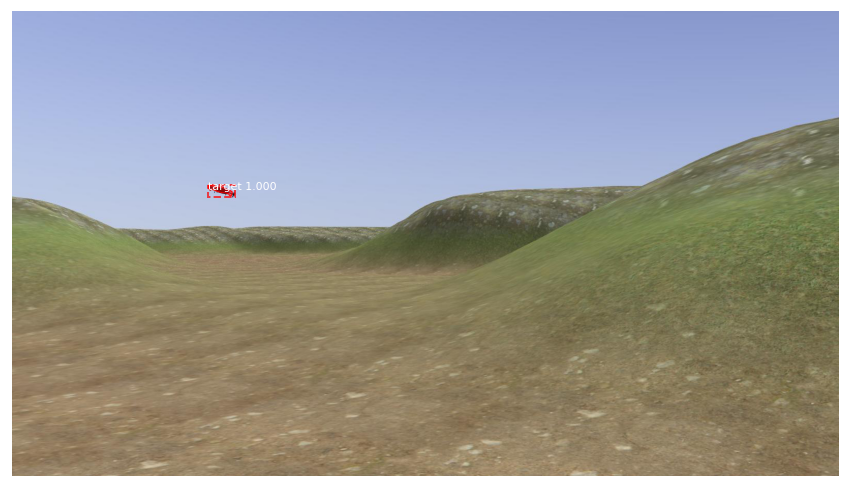

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_14.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  253.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  139.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


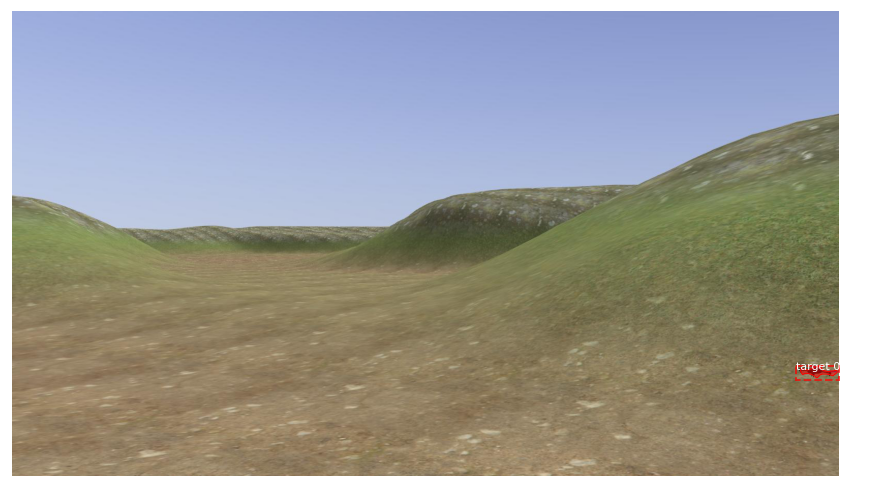

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_1.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  249.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  137.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


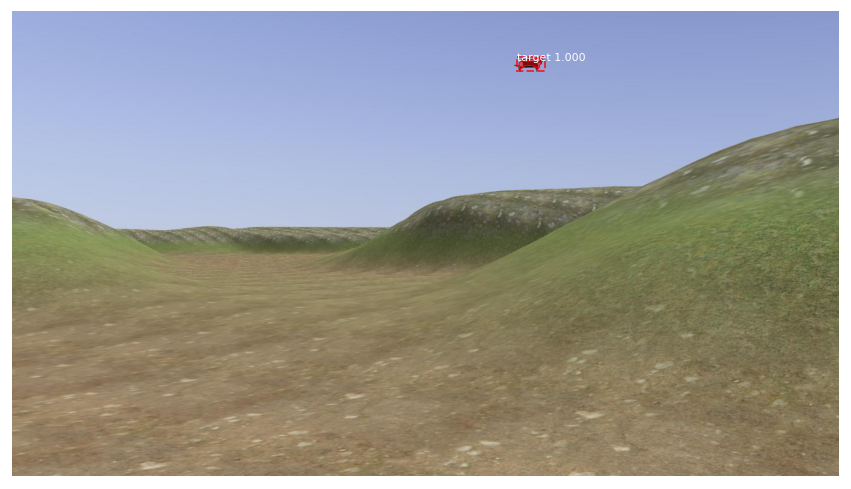

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_16.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  251.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  133.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


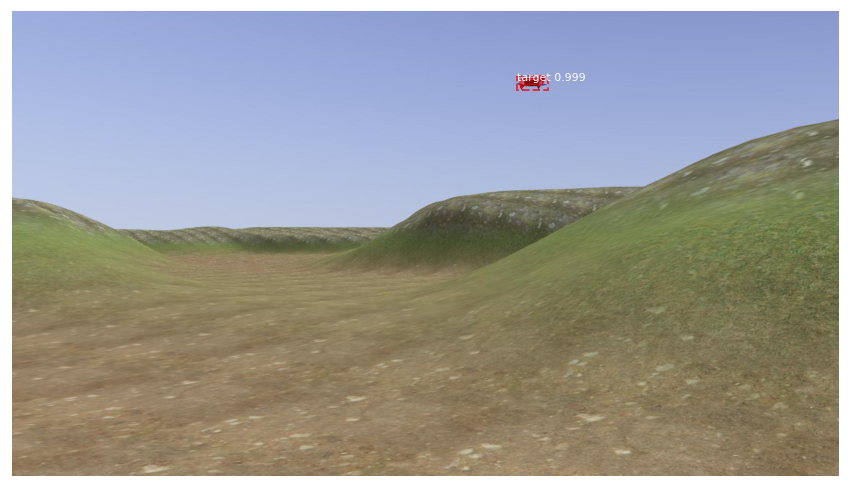

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_17.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  141.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


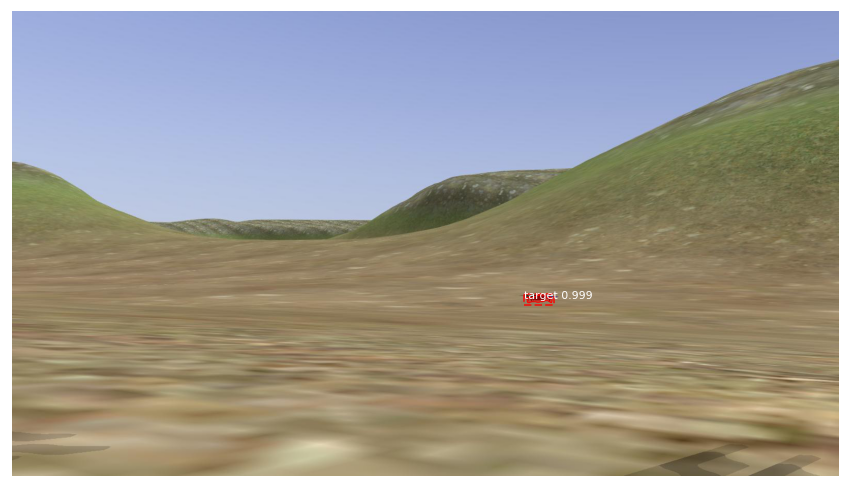

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_12.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  143.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


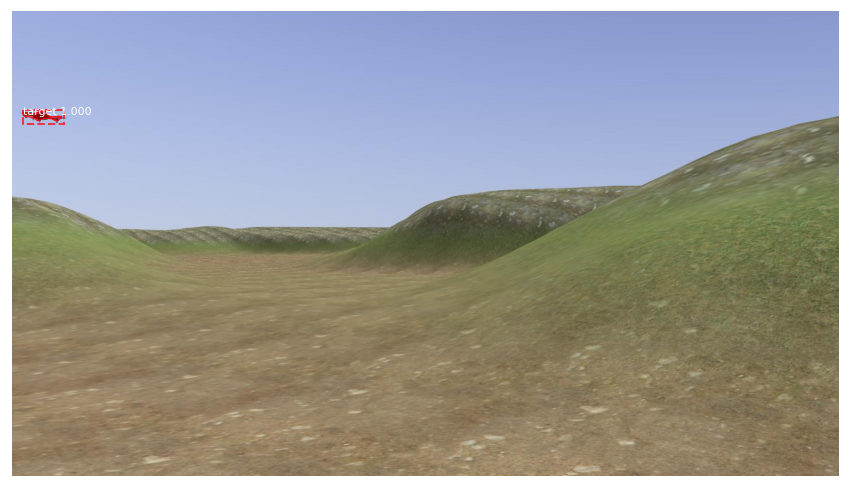

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_6.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  252.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  137.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


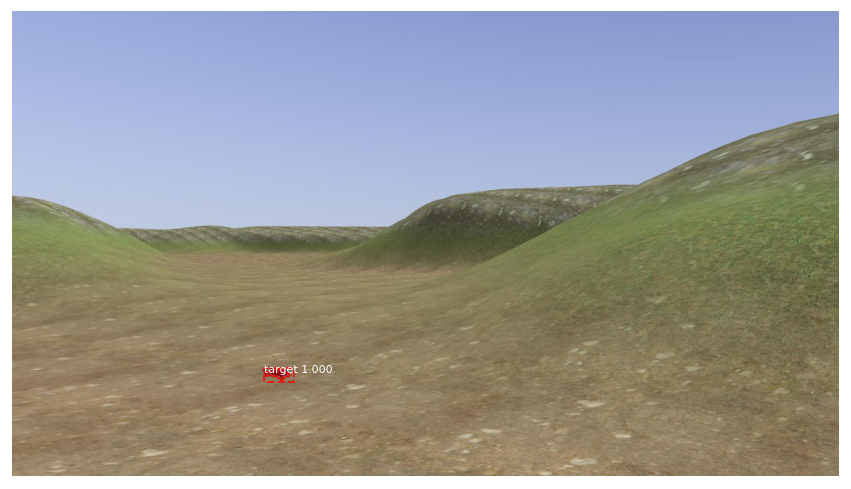

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_8.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  136.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


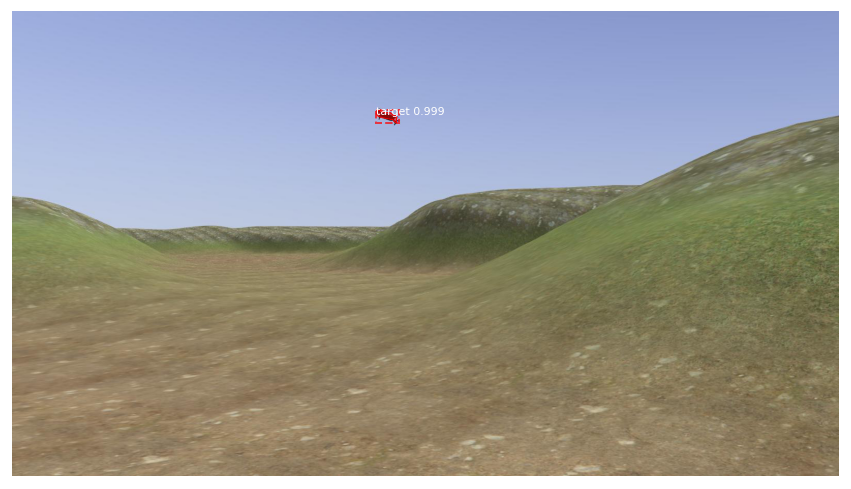

/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/image_10m/image_10m_21.jpg
Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  248.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  134.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


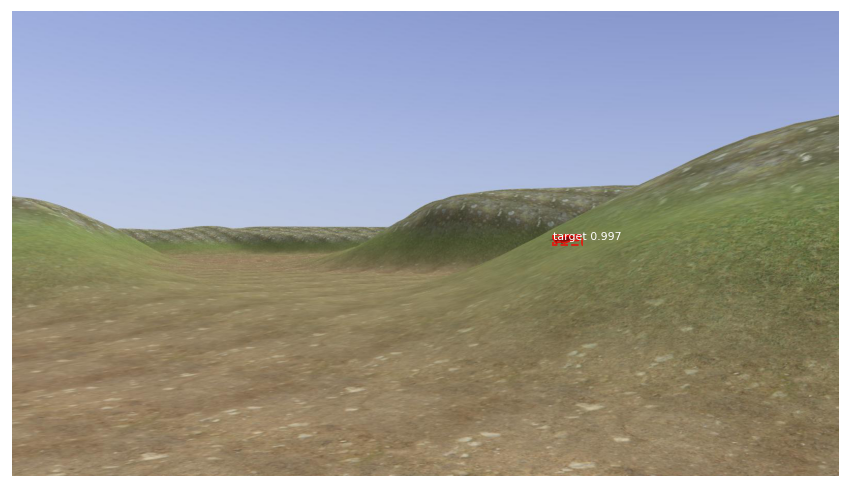

In [12]:
import skimage
import matplotlib.pyplot as plt
from Mask_RCNN.mrcnn.utils import *
from Mask_RCNN.mrcnn.model import *
import cv2

# APs = evaluate_model(dataset_test, model, inference_config)

image_name = "image_10m"
results_name = "results" + image_name[5:]

real_test_dir = '/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/' + image_name + '/'
image_paths = []
for filename in os.listdir(real_test_dir):
    if os.path.splitext(filename)[1].lower() in ['.png', '.jpg', '.jpeg']:
        image_paths.append(os.path.join(real_test_dir, filename))

bbox_values = []
count = 1
results_path = "/home/dylan/catkin_ws/src/mask_rcnn_ros/src/Mask_RCNN/datasets/droneDetection/real_test/" + results_name + "/"

for image_path in image_paths:
    print(image_path)
    img = skimage.io.imread(image_path)
    img_arr = np.array(img)
    results = model.detect([img_arr], verbose=1)
    r = results[0]
    bbox_values.append(r['rois'])
#     print(count)
    visualize.display_instances(img, r['rois'], r['masks'], r['class_ids'], 
                                class_names, r['scores'], figsize=(15,15))
#     plt.savefig(results_path + results_name +"_"+str(count)+".jpg")
    plt.show()
    count+=1

In [13]:
print(len(APs))
print(APs)
print(f"\nmAP is: {sum(APs)/len(APs)}")

NameError: name 'APs' is not defined